Bike Sharing analysis EDA

In [1]:
# imports
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go

%matplotlib inline

C:\Users\iTi\AppData\Local\Temp\ipykernel_19696\1905558968.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
file_path = 'E:/DOWN/bike sharing/hour.csv'

# Load the dataset into a pandas DataFrame
hourly_data = pd.read_csv(file_path)


In [3]:
hourly_data

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0000,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0000,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0000,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0000,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0000,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,17375,2012-12-31,1,1,12,19,0,1,1,2,0.26,0.2576,0.60,0.1642,11,108,119
17375,17376,2012-12-31,1,1,12,20,0,1,1,2,0.26,0.2576,0.60,0.1642,8,81,89
17376,17377,2012-12-31,1,1,12,21,0,1,1,1,0.26,0.2576,0.60,0.1642,7,83,90
17377,17378,2012-12-31,1,1,12,22,0,1,1,1,0.26,0.2727,0.56,0.1343,13,48,61


In [4]:
# print some generic statistics about the data
print(f"Shape of data: {hourly_data.shape}")
print(f"Number of missing values in the data:\
{hourly_data.isnull().sum().sum()}")

Shape of data: (17379, 17)
Number of missing values in the data:0


In [5]:
# get statistics on the numerical columns
hourly_data.describe().T
# T is for the transpose of the matrix 


,count,mean,std,min,25%,50%,75%,max
instant,17379.0,8690.000000,5017.029500,1.00,4345.5000,8690.0000,13034.5000,17379.0000
season,17379.0,2.501640,1.106918,1.00,2.0000,3.0000,3.0000,4.0000
yr,17379.0,0.502561,0.500008,0.00,0.0000,1.0000,1.0000,1.0000
mnth,17379.0,6.537775,3.438776,1.00,4.0000,7.0000,10.0000,12.0000
hr,17379.0,11.546752,6.914405,0.00,6.0000,12.0000,18.0000,23.0000
holiday,17379.0,0.028770,0.167165,0.00,0.0000,0.0000,0.0000,1.0000
weekday,17379.0,3.003683,2.005771,0.00,1.0000,3.0000,5.0000,6.0000
workingday,17379.0,0.682721,0.465431,0.00,0.0000,1.0000,1.0000,1.0000
weathersit,17379.0,1.425283,0.639357,1.00,1.0000,1.0000,2.0000,4.0000
temp,17379.0,0.496987,0.192556,0.02,0.3400,0.5000,0.6600,1.0000


Preprocessing Temporal and Weather Features

In [6]:
# create a copy of the original data
preprocessed_data = hourly_data.copy()


In [7]:
# transform seasons

seasons_mapping = {1: 'winter', 2: 'spring', \
                   3: 'summer', 4: 'fall'}
preprocessed_data['season'] = preprocessed_data['season']\
                              .apply(lambda x: seasons_mapping[x])

In [8]:
# transform year

yr_mapping = {0: 2011, 1: 2012}
preprocessed_data['yr'] = preprocessed_data['yr']\
                          .apply(lambda x: yr_mapping[x])


In [9]:
# transform weekday
weekday_mapping = {0: 'Sunday', 1: 'Monday', 2: 'Tuesday', \
                   3: 'Wednesday', 4: 'Thursday', 5: 'Friday', \
                   6: 'Saturday'} 
preprocessed_data['weekday'] = preprocessed_data['weekday']\
                               .apply(lambda x: weekday_mapping[x])

In [10]:
preprocessed_data

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,winter,2011,1,0,0,Saturday,0,1,0.24,0.2879,0.81,0.0000,3,13,16
1,2,2011-01-01,winter,2011,1,1,0,Saturday,0,1,0.22,0.2727,0.80,0.0000,8,32,40
2,3,2011-01-01,winter,2011,1,2,0,Saturday,0,1,0.22,0.2727,0.80,0.0000,5,27,32
3,4,2011-01-01,winter,2011,1,3,0,Saturday,0,1,0.24,0.2879,0.75,0.0000,3,10,13
4,5,2011-01-01,winter,2011,1,4,0,Saturday,0,1,0.24,0.2879,0.75,0.0000,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,17375,2012-12-31,winter,2012,12,19,0,Monday,1,2,0.26,0.2576,0.60,0.1642,11,108,119
17375,17376,2012-12-31,winter,2012,12,20,0,Monday,1,2,0.26,0.2576,0.60,0.1642,8,81,89
17376,17377,2012-12-31,winter,2012,12,21,0,Monday,1,1,0.26,0.2576,0.60,0.1642,7,83,90
17377,17378,2012-12-31,winter,2012,12,22,0,Monday,1,1,0.26,0.2727,0.56,0.1343,13,48,61


In [11]:
# transform weathersit
weather_mapping = {1: 'clear', 2: 'cloudy', \
                   3: 'light_rain_snow', 4: 'heavy_rain_snow'}
preprocessed_data['weathersit'] = preprocessed_data['weathersit']\
                                  .apply(lambda x: \
weather_mapping[x])


In [12]:
# transform hum and windspeed
preprocessed_data['hum'] = preprocessed_data['hum']*100
preprocessed_data['windspeed'] = preprocessed_data['windspeed']\
                                 *67

In [13]:
# visualize preprocessed columns
cols = ['season', 'yr', 'weekday', \
        'weathersit', 'hum', 'windspeed']
preprocessed_data[cols].sample(10, random_state=123)


,season,yr,weekday,weathersit,hum,windspeed
5792,summer,2011,Saturday,clear,74.0,8.9981
7823,fall,2011,Sunday,clear,43.0,31.0009
15426,fall,2012,Tuesday,cloudy,77.0,6.0032
15028,fall,2012,Sunday,clear,51.0,22.0028
12290,spring,2012,Friday,cloudy,89.0,12.9980
3262,spring,2011,Friday,clear,64.0,7.0015
10763,spring,2012,Thursday,clear,42.0,23.9994
12384,spring,2012,Tuesday,light_rain_snow,82.0,11.0014
6051,summer,2011,Wednesday,clear,52.0,19.0012
948,winter,2011,Saturday,clear,80.0,0.0000


In [14]:
"""
assert that total number of rides is equal to the sum of registered and 
casual ones
"""
assert (preprocessed_data.casual \
        + preprocessed_data.registered \
        == preprocessed_data.cnt).all(), \
       'Sum of casual and registered rides not equal '\
 'to total number of rides'

C:\Users\iTi\AppData\Local\Temp\ipykernel_19696\1005224936.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(preprocessed_data['registered'], label='registered')
C:\Users\iTi\AppData\Local\Temp\ipykernel_19696\1005224936.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(preprocessed_data['ca

Text(0.5, 1.0, 'Rides distributions')

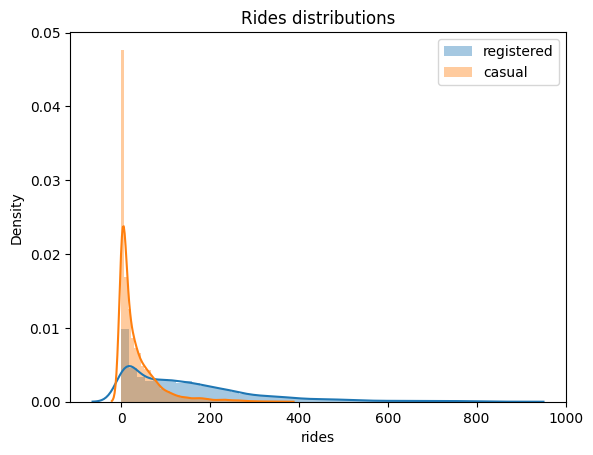

In [15]:
# plot distributions of registered vs casual rides
sns.distplot(preprocessed_data['registered'], label='registered')
sns.distplot(preprocessed_data['casual'], label='casual')
plt.legend()
plt.xlabel('rides')
plt.title("Rides distributions")


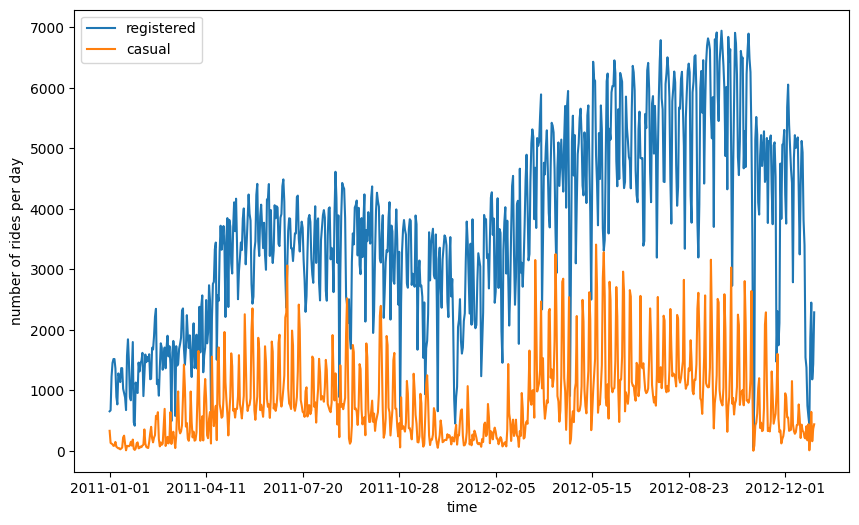

In [16]:
# plot evolution of rides over time
plot_data = preprocessed_data[['registered', 'casual', 'dteday']]
ax = plot_data.groupby('dteday').sum().plot(figsize=(10,6))
ax.set_xlabel("time");
ax.set_ylabel("number of rides per day");

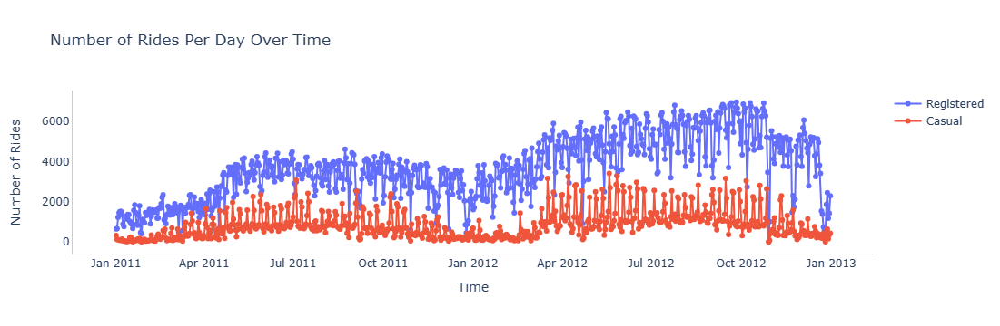

In [17]:
# Group the data by 'dteday' and sum up 'registered' and 'casual' rides
grouped_data = preprocessed_data.groupby('dteday')[['registered', 'casual']].sum().reset_index()

# Create traces for Plotly
trace1 = go.Scatter(x=grouped_data['dteday'], y=grouped_data['registered'], mode='lines+markers', name='Registered')
trace2 = go.Scatter(x=grouped_data['dteday'], y=grouped_data['casual'], mode='lines+markers', name='Casual')

# Create the figure and add traces
fig = go.Figure()
fig.add_trace(trace1)
fig.add_trace(trace2)

# Update layout with titles and axis labels
fig.update_layout(title='Number of Rides Per Day Over Time',
                  xaxis_title='Time',
                  yaxis_title='Number of Rides',
                  xaxis=dict(showline=True, showgrid=False, linecolor='rgb(204, 204, 204)'),
                  yaxis=dict(showline=True, showgrid=False, linecolor='rgb(204, 204, 204)'),
                  plot_bgcolor='white')

# Show the figure
fig.show()

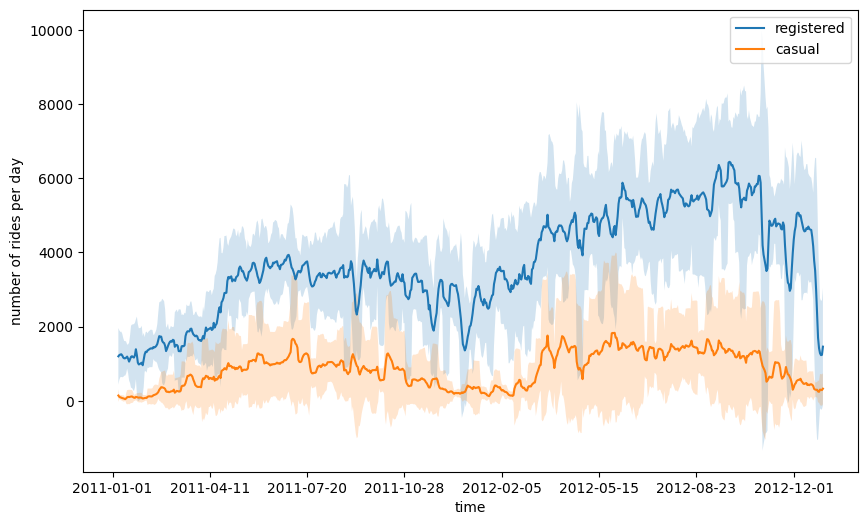

In [18]:
"""
Create new dataframe with necessary for plotting columns, and obtain 
number of rides per day, by grouping over each day
"""
plot_data = preprocessed_data[['registered', 'casual', 'dteday']]
plot_data = plot_data.groupby('dteday').sum()
"""
define window for computing the rolling mean and standard deviation
"""
window = 7
rolling_means = plot_data.rolling(window).mean()
rolling_deviations = plot_data.rolling(window).std()
"""
Create a plot of the series, where we first plot the series of rolling 
means, then we color the zone between the series of rolling means +- 2 
rolling standard deviations
"""
ax = rolling_means.plot(figsize=(10,6))
ax.fill_between(rolling_means.index, rolling_means['registered'] \
                + 2*rolling_deviations['registered'], \
                rolling_means['registered'] \
                - 2*rolling_deviations['registered'], \
                alpha = 0.2)
ax.fill_between(rolling_means.index, rolling_means['casual'] \
                + 2*rolling_deviations['casual'], \
                rolling_means['casual'] \
                - 2*rolling_deviations['casual'], \
                alpha = 0.2)
ax.set_xlabel("time");
ax.set_ylabel("number of rides per day");

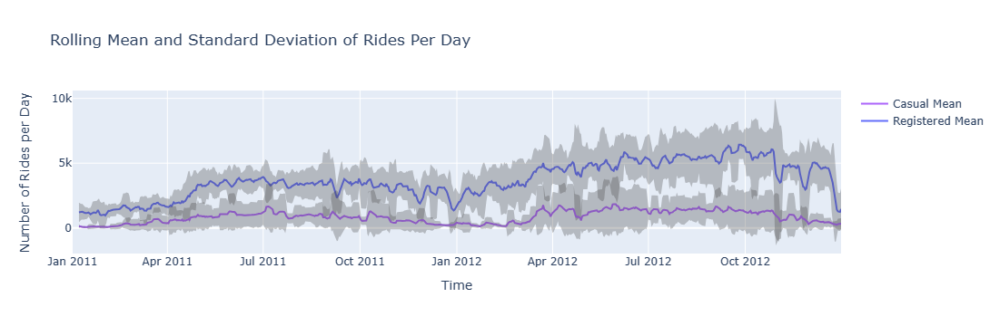

In [19]:
fig = go.Figure()

# Rolling mean trace for registered users
fig.add_trace(go.Scatter(x=rolling_means.index, y=rolling_means['registered'], mode='lines', name='Registered Mean'))

# Upper bound for registered users
fig.add_trace(go.Scatter(x=rolling_means.index, y=rolling_means['registered'] + 2 * rolling_deviations['registered'],
                         mode='lines', name='Registered Upper Bound', marker=dict(color="#444"), line=dict(width=0),
                         showlegend=False))

# Lower bound for registered users
fig.add_trace(go.Scatter(x=rolling_means.index, y=rolling_means['registered'] - 2 * rolling_deviations['registered'],
                         mode='lines', name='Registered Lower Bound', marker=dict(color="#444"), line=dict(width=0),
                         fillcolor='rgba(68, 68, 68, 0.3)', fill='tonexty', showlegend=False))

# Rolling mean trace for casual users
fig.add_trace(go.Scatter(x=rolling_means.index, y=rolling_means['casual'], mode='lines', name='Casual Mean'))

# Upper bound for casual users
fig.add_trace(go.Scatter(x=rolling_means.index, y=rolling_means['casual'] + 2 * rolling_deviations['casual'],
                         mode='lines', name='Casual Upper Bound', marker=dict(color="#444"), line=dict(width=0),
                         showlegend=False))

# Lower bound for casual users
fig.add_trace(go.Scatter(x=rolling_means.index, y=rolling_means['casual'] - 2 * rolling_deviations['casual'],
                         mode='lines', name='Casual Lower Bound', marker=dict(color="#444"), line=dict(width=0),
                         fillcolor='rgba(68, 68, 68, 0.3)', fill='tonexty', showlegend=False))

# Finalizing the layout of the plot
fig.update_layout(title='Rolling Mean and Standard Deviation of Rides Per Day',
                  xaxis_title='Time',
                  yaxis_title='Number of Rides per Day',
                  hovermode='x')

fig.show()

C:\Users\iTi\AppData\Local\Programs\Python\Python312\Lib\site-packages\seaborn\axisgrid.py:718: UserWarning:

Using the barplot function without specifying `order` is likely to produce an incorrect plot.



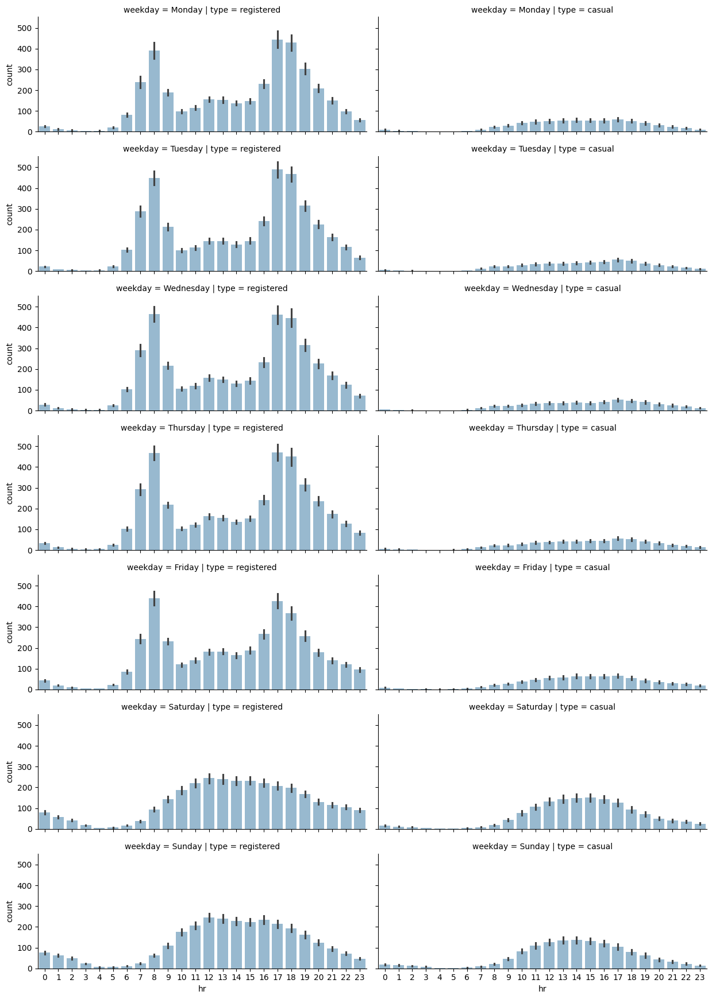

In [20]:
# select relevant columns
plot_data = preprocessed_data[['hr', 'weekday', 'registered', 'casual']]
"""
transform the data into a format, in number of entries are computed as 
count, 
for each distinct hr, weekday and type (registered or casual)
"""
plot_data = plot_data.melt(id_vars=['hr', 'weekday'], \
                           var_name='type', value_name='count')
"""
create FacetGrid object, in which a grid plot is produced.
As columns, we have the various days of the week,
as rows, the different types (registered and casual)
"""
grid = sns.FacetGrid(plot_data, row='weekday', \
                     col='type', height=2.5, aspect=2.5, \
                     row_order=['Monday', 'Tuesday', \
                                'Wednesday', 'Thursday', \
'Friday', 'Saturday', 'Sunday'])
# populate the FacetGrid with the specific plots
grid.map(sns.barplot, 'hr', 'count', alpha=0.5)

Analyzing seosnal impacts on rides 

In [21]:

# select subset of the data
plot_data = preprocessed_data[['hr', 'season', \
                               'registered', 'casual']]


In [22]:
plot_data

,hr,season,registered,casual
0,0,winter,13,3
1,1,winter,32,8
2,2,winter,27,5
3,3,winter,10,3
4,4,winter,1,0
...,...,...,...,...
17374,19,winter,108,11
17375,20,winter,81,8
17376,21,winter,83,7
17377,22,winter,48,13


In [23]:
# unpivot data from wide to long format
plot_data = plot_data.melt(id_vars=['hr', 'season'], \
                           var_name='type', value_name='count')

In [24]:
plot_data

,hr,season,type,count
0,0,winter,registered,13
1,1,winter,registered,32
2,2,winter,registered,27
3,3,winter,registered,10
4,4,winter,registered,1
...,...,...,...,...
34753,19,winter,casual,11
34754,20,winter,casual,8
34755,21,winter,casual,7
34756,22,winter,casual,13


C:\Users\iTi\AppData\Local\Programs\Python\Python312\Lib\site-packages\seaborn\axisgrid.py:718: UserWarning:

Using the barplot function without specifying `order` is likely to produce an incorrect plot.



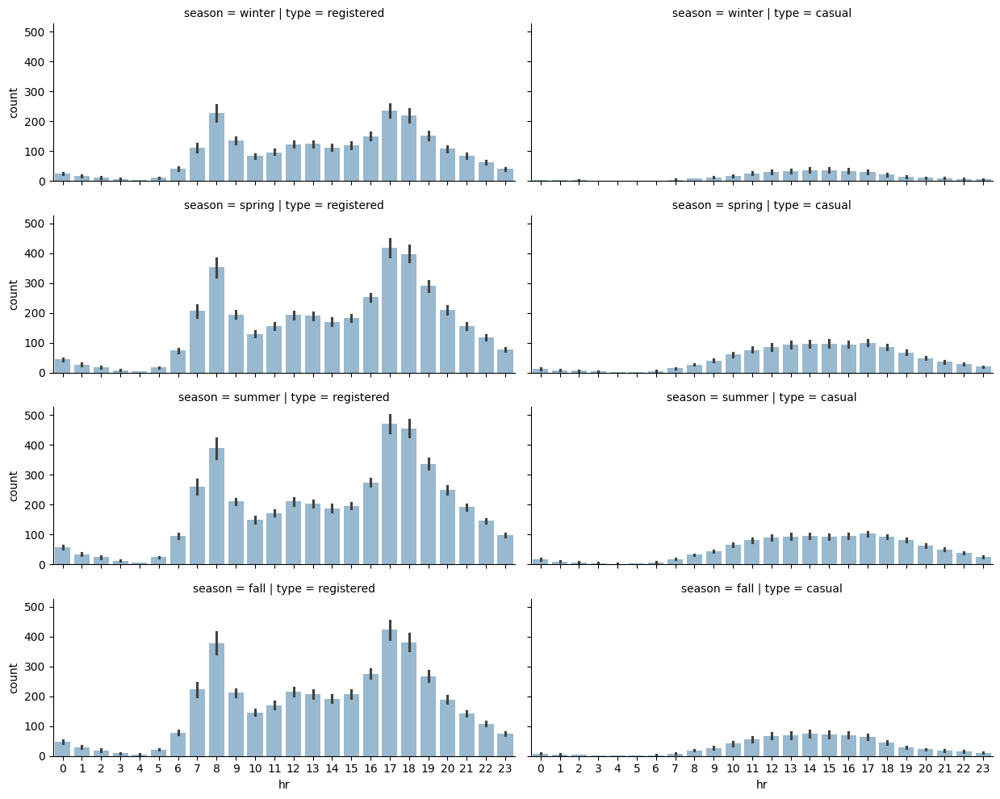

In [25]:
# define FacetGrid
grid = sns.FacetGrid(plot_data, row='season', \
                     col='type', height=2.5, \
                     aspect=2.5, \
                     row_order=['winter', 'spring', \
                                'summer', 'fall'])
grid.map(sns.barplot, 'hr', 'count', alpha=0.5)


the distribution of rides on a weekday basis

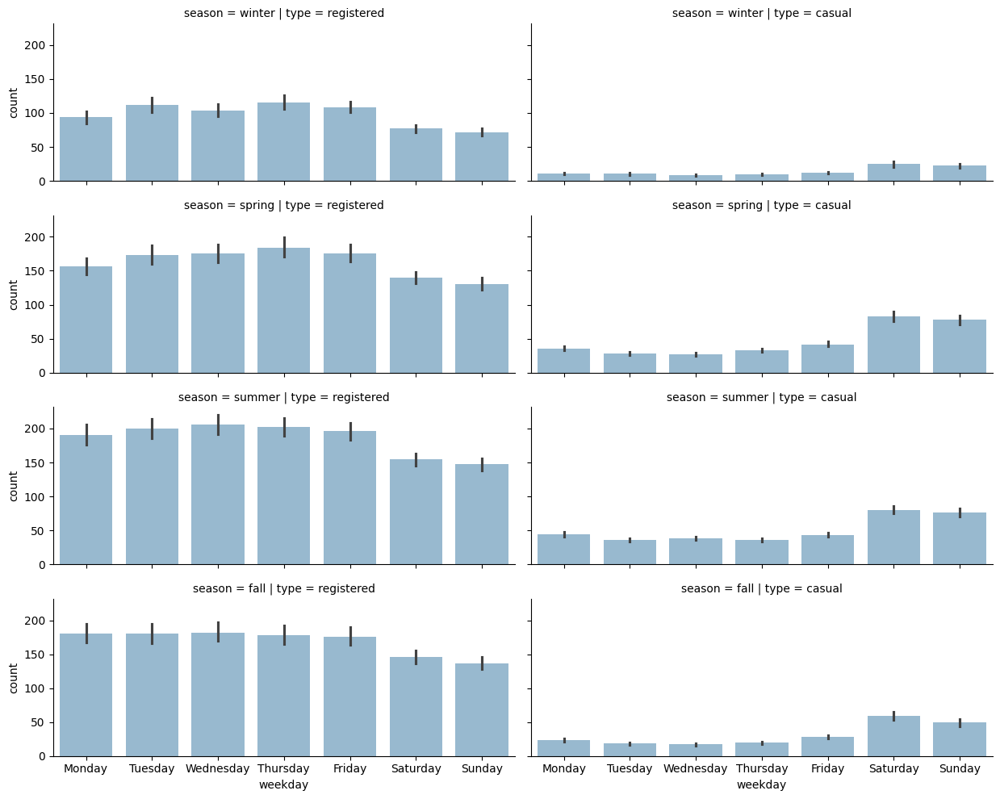

In [26]:
plot_data = preprocessed_data[['weekday', 'season', \
                               'registered', 'casual']]
plot_data = plot_data.melt(id_vars=['weekday', 'season'], \
                           var_name='type', value_name='count')
grid = sns.FacetGrid(plot_data, row='season', col='type', \
                     height=2.5, aspect=2.5, \
                     row_order=['winter', 'spring', \
                                'summer', 'fall'])
grid.map(sns.barplot, 'weekday', 'count', alpha=0.5, \
         order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', \
                'Friday', 'Saturday', 'Sunday'])


TESTING Our Hypotheisis 
 H_0 : average registered rides over weekdays-average registered rides over 
weekend=0
and 
H_a : average registered rides over weekdays-average registered rides over 
weekend≠0


In [27]:
population_mean = preprocessed_data.registered.mean()

In [28]:
weekend_days = ['Saturday', 'Sunday']
weekend_mask = preprocessed_data.weekday.isin(weekend_days)
workingdays_mask = ~preprocessed_data.weekday.isin(weekend_days)

In [29]:
weekend_data = preprocessed_data.registered[weekend_mask]
workingdays_data = preprocessed_data.registered[workingdays_mask]

In [30]:
# perform ttest
from scipy.stats import ttest_ind
test_res = ttest_ind(weekend_data, workingdays_data)
print(f"Statistic value: {test_res[0]:.03f}, \
p-value: {test_res[1]:.03f}")

Statistic value: -16.004, p-value: 0.000


we can reject the null hypothesis 
and confirm that our initial observation is correct: that is, there is a statistically 
significant difference between the number of rides performed during working 
days and the weekend

C:\Users\iTi\AppData\Local\Temp\ipykernel_19696\3382985303.py:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\iTi\AppData\Local\Temp\ipykernel_19696\3382985303.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




Text(0.5, 1.0, 'Registered rides distributions')

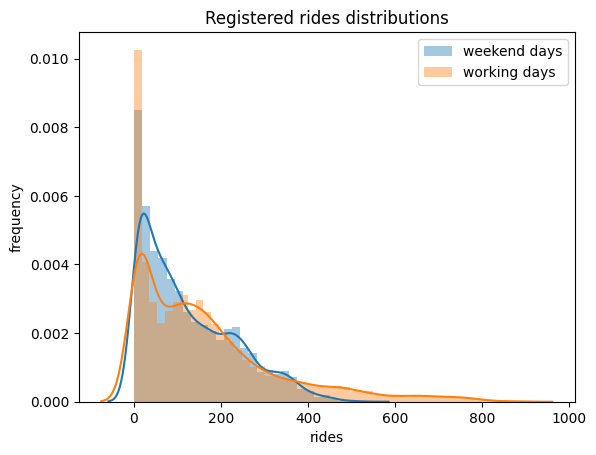

In [31]:
sns.distplot(weekend_data, label='weekend days')
sns.distplot(workingdays_data, label='working days')
plt.legend()
plt.xlabel('rides')
plt.ylabel('frequency')
plt.title("Registered rides distributions")


another hypothsis test on if that is, casual users perform more rides during the 
weekend. In this case, the null hypothesis is that the average number of rides 
during working days is the same as the average number of rides during the 
weekend, both performed only by casual customers. The alternative hypothesis 
will then result in a statistically significant difference in the average number of 
rides between the two groups

Statistic value: 41.077, p-value: 0.000


C:\Users\iTi\AppData\Local\Temp\ipykernel_19696\3878113039.py:8: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


C:\Users\iTi\AppData\Local\Temp\ipykernel_19696\3878113039.py:9: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




Text(0.5, 1.0, 'Casual rides distributions')

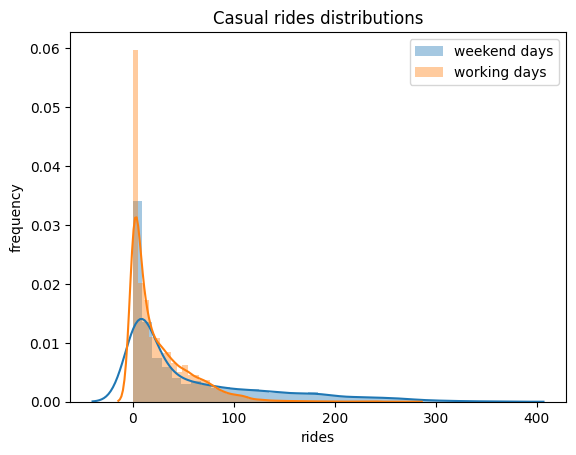

In [32]:
weekend_data = preprocessed_data.casual[weekend_mask]
workingdays_data = preprocessed_data.casual[workingdays_mask]

# perform ttest
test_res = ttest_ind(weekend_data, workingdays_data)
print(f"Statistic value: {test_res[0]:.03f}, p-value: {test_res[1]:.03f}")

sns.distplot(weekend_data, label='weekend days')
sns.distplot(workingdays_data, label='working days')
plt.legend()
plt.xlabel('rides')
plt.ylabel('frequency')
plt.title("Casual rides distributions")

Analysis of Weather-Related Features


In [33]:
def plot_correlations(data, col):
    # get correlation between col and registered rides
    corr_r = np.corrcoef(data[col], data["registered"])[0,1]
    ax = sns.regplot(x=col, y="registered", data=data, scatter_kws={"alpha":0.05}, 
                     label=f"Registered rides (correlation: {corr_r:.3f})")
    
    # get correlation between col and casual rides
    corr_c = np.corrcoef(data[col], data["casual"])[0,1]
    ax = sns.regplot(x=col, y='casual', data=data, scatter_kws={"alpha":0.05}, 
                    label=f"Casual rides (correlation: {corr_c:.3f})")
    
    #adjust legend alpha
    legend = ax.legend()
    for lh in legend.legendHandles: 
        lh.set_alpha(0.5)
        
    ax.set_ylabel("rides")
    ax.set_title(f"Correlation between rides and {col}")
    return ax

C:\Users\iTi\AppData\Local\Temp\ipykernel_19696\1005804809.py:14: MatplotlibDeprecationWarning:

The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.



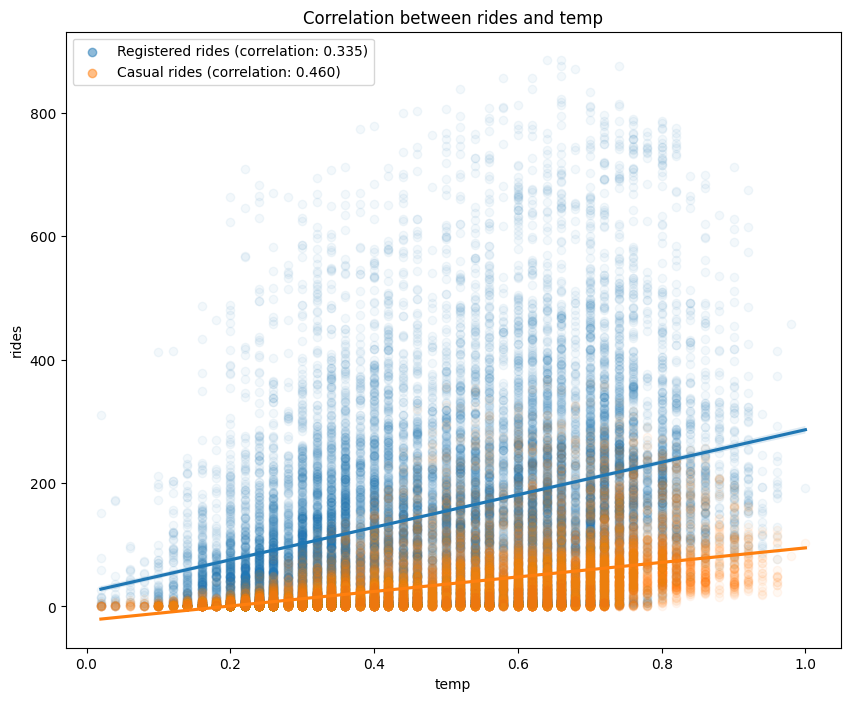

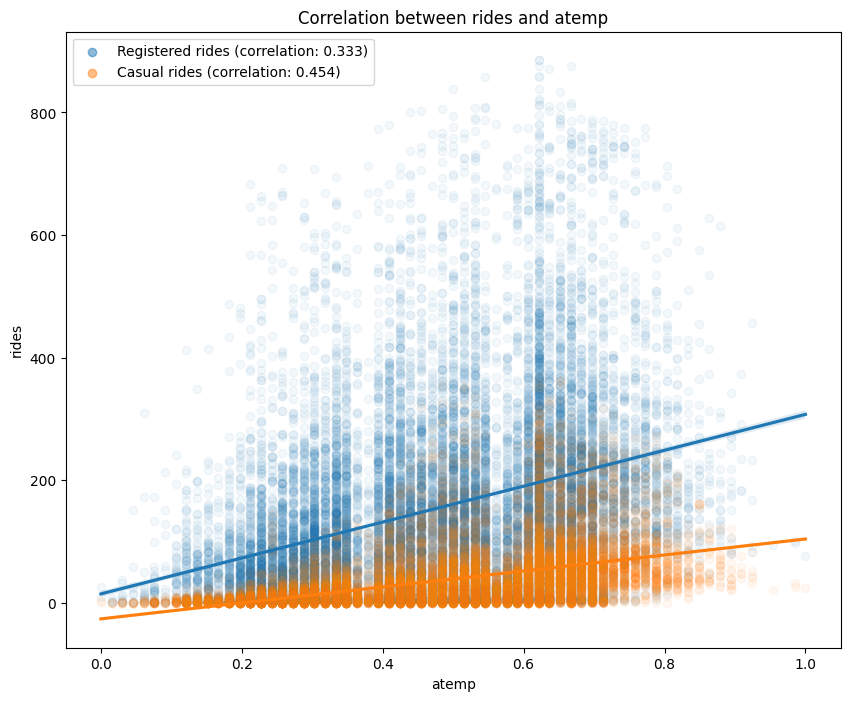

In [34]:
plt.figure(figsize=(10,8))
ax = plot_correlations(preprocessed_data, 'temp')
plt.figure(figsize=(10,8))
ax = plot_correlations(preprocessed_data, 'atemp')

C:\Users\iTi\AppData\Local\Temp\ipykernel_19696\1005804809.py:14: MatplotlibDeprecationWarning:

The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.



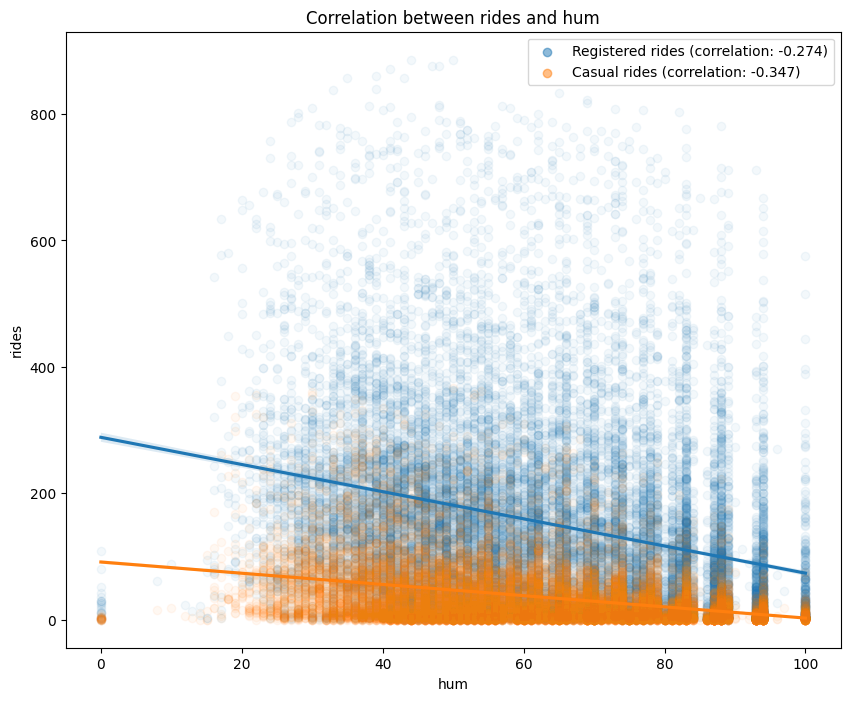

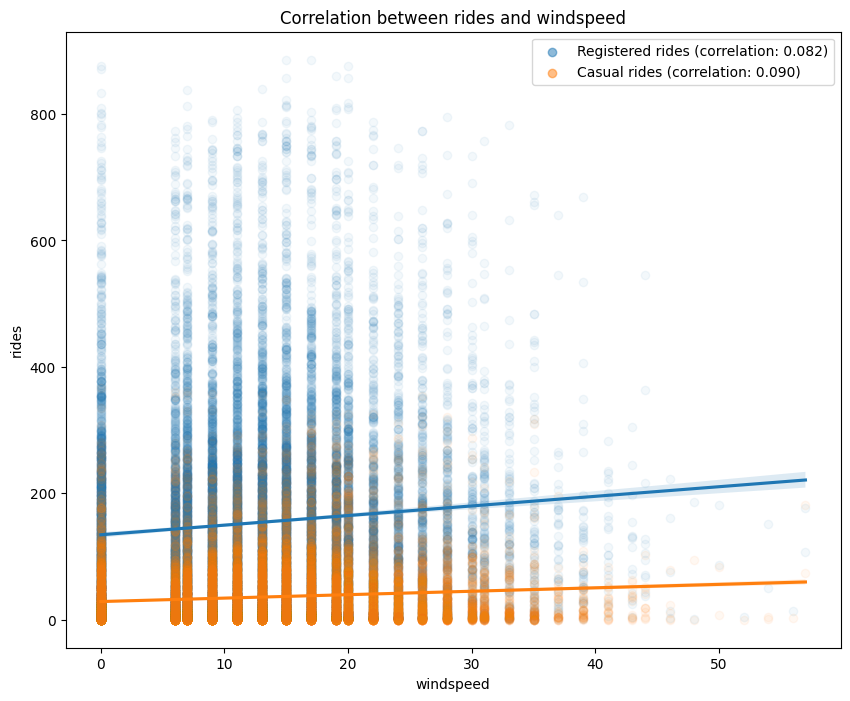

In [35]:
plt.figure(figsize=(10,8))
ax = plot_correlations(preprocessed_data, 'hum')
plt.figure(figsize=(10,8))
ax = plot_correlations(preprocessed_data, 'windspeed')


In [36]:
def compute_correlations(data, col):
    pearson_reg = pearsonr(data[col], data["registered"])[0]
    pearson_cas = pearsonr(data[col], data["casual"])[0]
    spearman_reg = spearmanr(data[col], data["registered"])[0]
    spearman_cas = spearmanr(data[col], data["casual"])[0]
    return pd.Series({"Pearson (registered)": pearson_reg,\
                      "Spearman (registered)": spearman_reg,\
"Pearson (casual)": pearson_cas,\
"Spearman (casual)": spearman_cas})

In [37]:
from scipy.stats import pearsonr, spearmanr

cols = ["temp", "atemp", "hum", "windspeed"]
corr_data = pd.DataFrame(index=["Pearson (registered)", \
                                "Spearman (registered)",\
"Pearson (casual)", \
"Spearman (casual)"])
for col in cols:
    corr_data[col]=compute_correlations(preprocessed_data, col)
corr_data.T

,Pearson (registered),Spearman (registered),Pearson (casual),Spearman (casual)
temp,0.335361,0.373196,0.459616,0.570989
atemp,0.332559,0.373014,0.454080,0.570419
hum,-0.273933,-0.338480,-0.347028,-0.388213
windspeed,0.082321,0.122936,0.090287,0.122920


(5.5, -0.5)

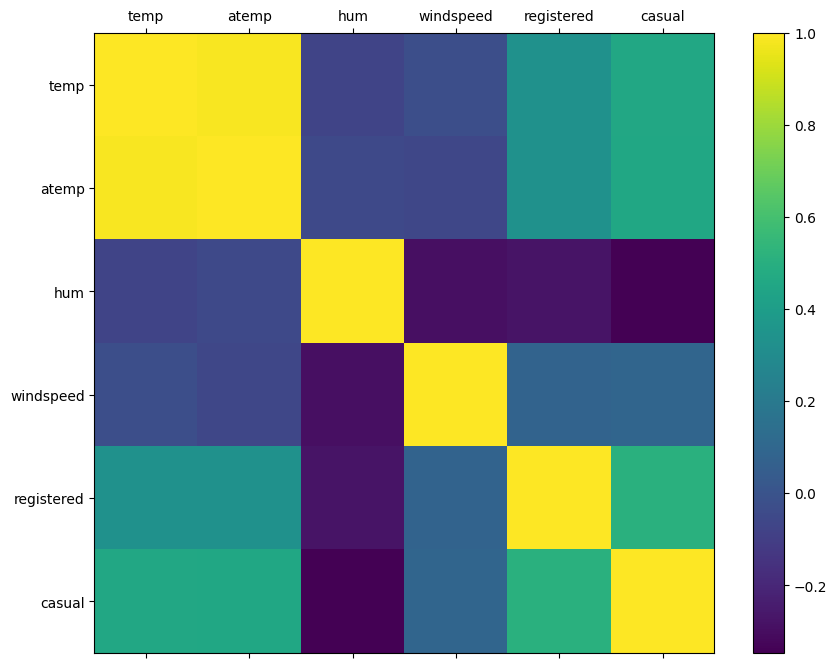

In [38]:

# plot correlation matrix
cols = ["temp", "atemp", "hum", "windspeed", \
        "registered", "casual"]
plot_data = preprocessed_data[cols]
corr = plot_data.corr()
fig = plt.figure(figsize=(10,8))
plt.matshow(corr, fignum=fig.number)
plt.xticks(range(len(plot_data.columns)), plot_data.columns)
plt.yticks(range(len(plot_data.columns)), plot_data.columns)
plt.colorbar()
plt.ylim([5.5, -0.5])

Time series analysis

In [39]:
#plotting rolling statistics and ADF test for time series
from statsmodels.tsa.stattools import adfuller
def test_stationarity(ts, window=10, **kwargs):
# create dataframe for plotting
    plot_data = pd.DataFrame(ts)
    plot_data['rolling_mean'] = ts.rolling(window).mean()
    plot_data['rolling_std'] = ts.rolling(window).std()
    # compute p-value of Dickey-Fuller test
    p_val = adfuller(ts)[1]
    ax = plot_data.plot(**kwargs)
    ax.set_title(f"Dickey-Fuller p-value: {p_val:.3f}")


In [70]:
daily_rides

,registered,casual
dteday,,
2011-01-01,654,331
2011-01-02,670,131
2011-01-03,1229,120
2011-01-04,1454,108
2011-01-05,1518,82
...,...,...
2012-12-27,1867,247
2012-12-28,2451,644
2012-12-29,1182,159


In [40]:

daily_rides = preprocessed_data[["dteday", "registered", \
                                 "casual"]]
daily_rides = daily_rides.groupby("dteday").sum()
# convert index to DateTime object
daily_rides.index = pd.to_datetime(daily_rides.index)


In [83]:
outliers_rolling_registered = daily_rides.registered[(np.abs(daily_rides['registered'] -daily_rides.registered.rolling(10).mean()) > 2 * daily_rides.registered.rolling(10).std())]
outliers_rolling_casual= daily_rides.casual[(np.abs(daily_rides['casual'] -daily_rides.casual.rolling(10).mean()) > 2 * daily_rides.casual.rolling(10).std())]


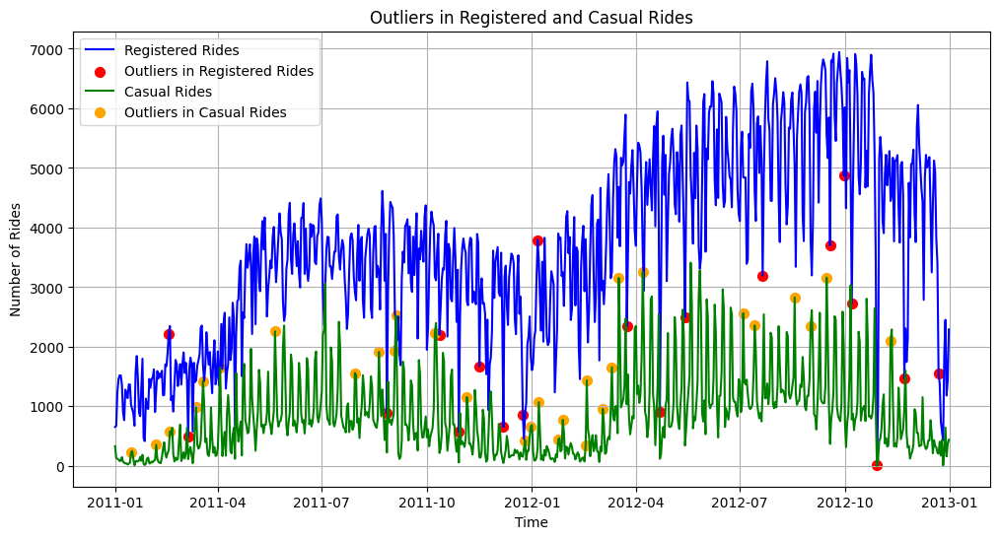

In [84]:
outliers_df = pd.DataFrame({
    'registered': daily_rides.registered,
    'casual': daily_rides.casual,
    'outlier_registered': outliers_rolling_registered,
    'outlier_casual': outliers_rolling_casual
})

plt.figure(figsize=(12, 6))

plt.plot(daily_rides.index, daily_rides.registered, label='Registered Rides', color='blue')
plt.scatter(outliers_df.index, outliers_df['outlier_registered'], color='red', label='Outliers in Registered Rides', s=50)  # s is the size of points

plt.plot(daily_rides.index, daily_rides.casual, label='Casual Rides', color='green')
plt.scatter(outliers_df.index, outliers_df['outlier_casual'], color='orange', label='Outliers in Casual Rides', s=50)

plt.title('Outliers in Registered and Casual Rides')
plt.xlabel('Time')
plt.ylabel('Number of Rides')
plt.legend()
plt.grid(True)
plt.show()

In [88]:
outliers_rolling_causal

dteday
2011-01-15     222
2011-02-06     354
2011-02-18     579
2011-03-13     982
2011-03-19    1424
2011-04-03    1651
2011-05-21    2258
2011-07-30    1559
2011-08-20    1914
2011-09-03    1935
2011-09-04    2521
2011-10-08    2235
2011-11-05    1156
2011-12-26     430
2011-12-31     665
2012-01-07    1070
2012-01-24     439
2012-01-28     775
2012-02-17     349
2012-02-18    1435
2012-03-03     956
2012-03-11    1658
2012-03-17    3155
2012-04-07    3252
2012-07-04    2562
2012-07-14    2355
2012-08-18    2827
2012-09-01    2352
2012-09-15    3160
2012-11-10    2090
Name: casual, dtype: int64

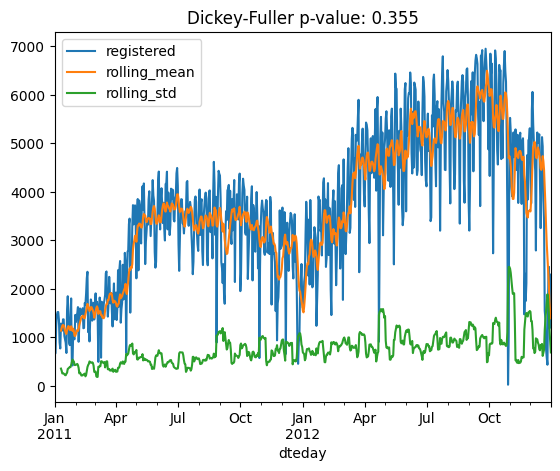

In [41]:
test_stationarity(daily_rides.registered)


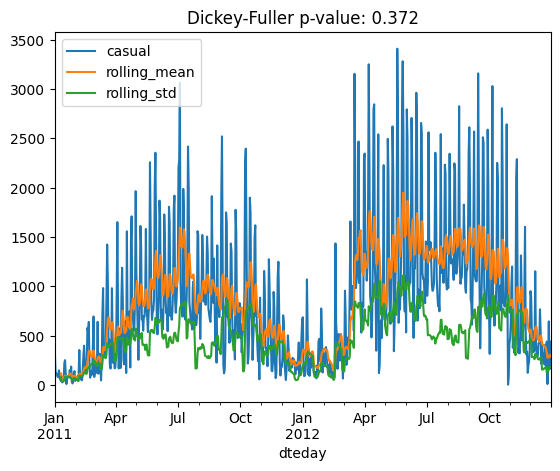

In [42]:
test_stationarity(daily_rides.casual)


For the registered and casual columns, the Dickey-Fuller test yields values of 0.355 and 0.372, respectively. This is compelling proof that the time series is not stationary, and in order to produce a stationary one, we must process them.
checking whether the time series 
is stationary by subtracting their rolling means and last values

In [43]:
# subtract rolling mean
registered = daily_rides["registered"]
registered_ma = registered.rolling(10).mean()
registered_ma_diff = registered - registered_ma
registered_ma_diff.dropna(inplace=True)
casual = daily_rides["casual"]
casual_ma = casual.rolling(10).mean()
casual_ma_diff = casual - casual_ma
casual_ma_diff.dropna(inplace=True)

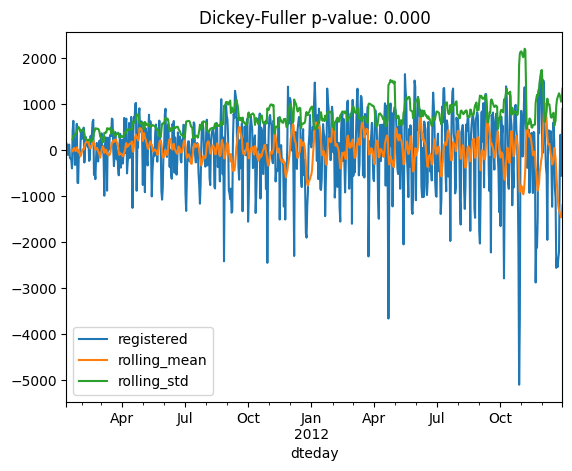

In [44]:
test_stationarity(registered_ma_diff)


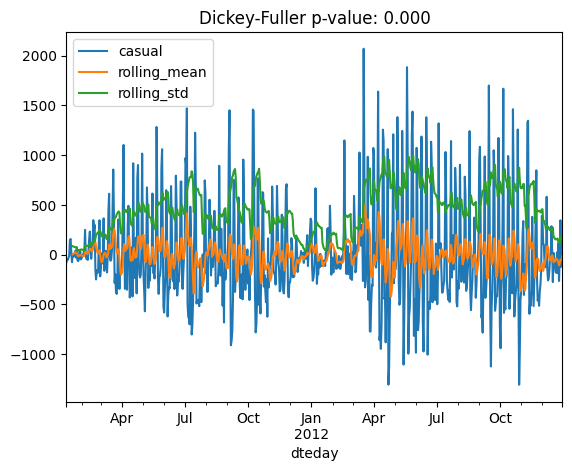

In [45]:
test_stationarity(casual_ma_diff)


<Figure size 640x480 with 0 Axes>

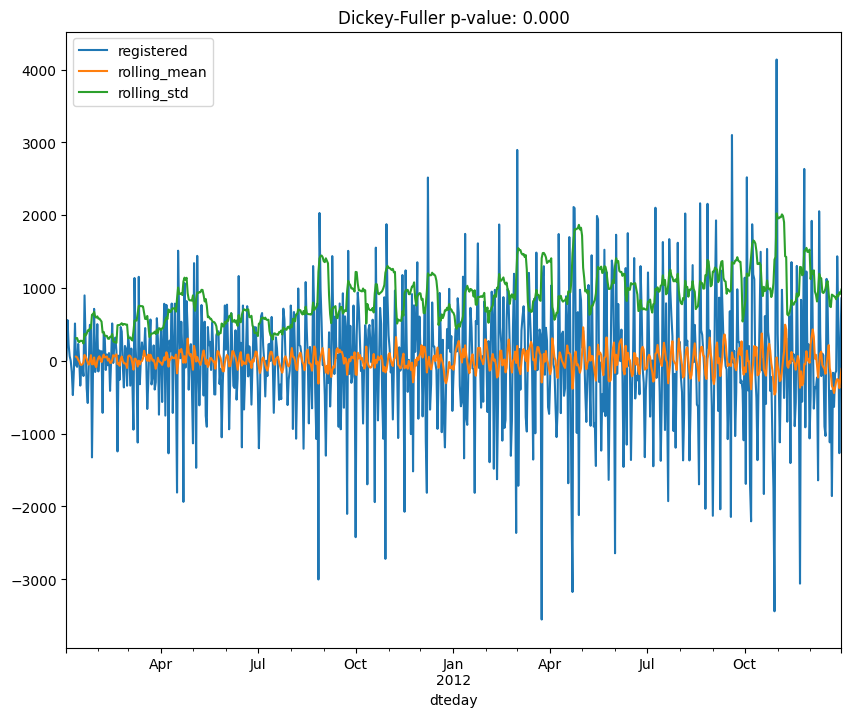

In [46]:
# subtract last value
registered = daily_rides["registered"]
registered_diff = registered - registered.shift()
registered_diff.dropna(inplace=True)
casual = daily_rides["casual"]
casual_diff = casual - casual.shift()
casual_diff.dropna(inplace=True)
plt.figure()
test_stationarity(registered_diff, figsize=(10, 8))


<Figure size 640x480 with 0 Axes>

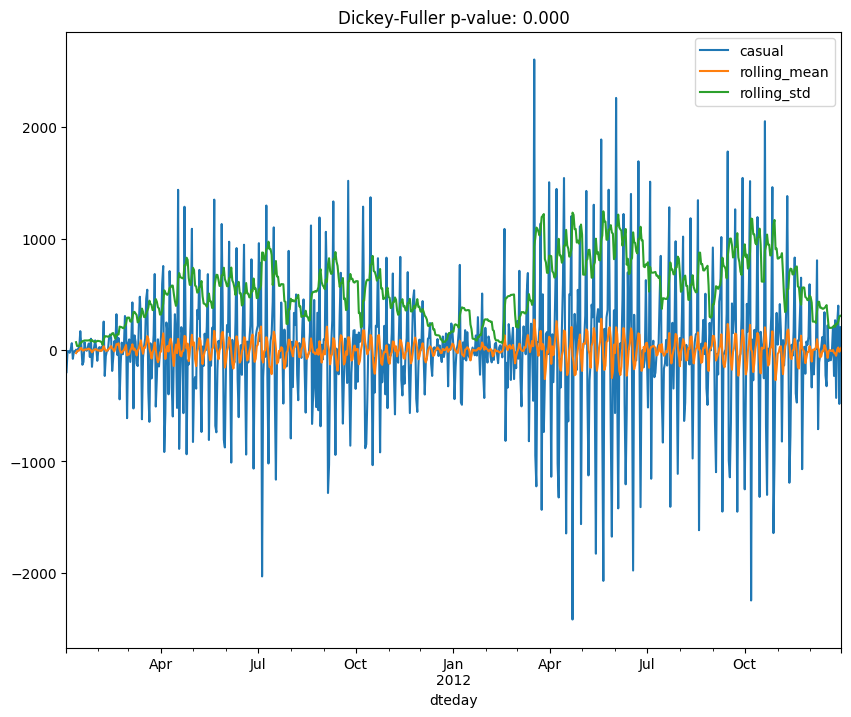

In [47]:
plt.figure()
test_stationarity(casual_diff, figsize=(10, 8))

time series decomposition

In [48]:
from statsmodels.tsa.seasonal import seasonal_decompose
registered_decomposition = seasonal_decompose(\
                           daily_rides["registered"])
casual_decomposition = seasonal_decompose(daily_rides["casual"])

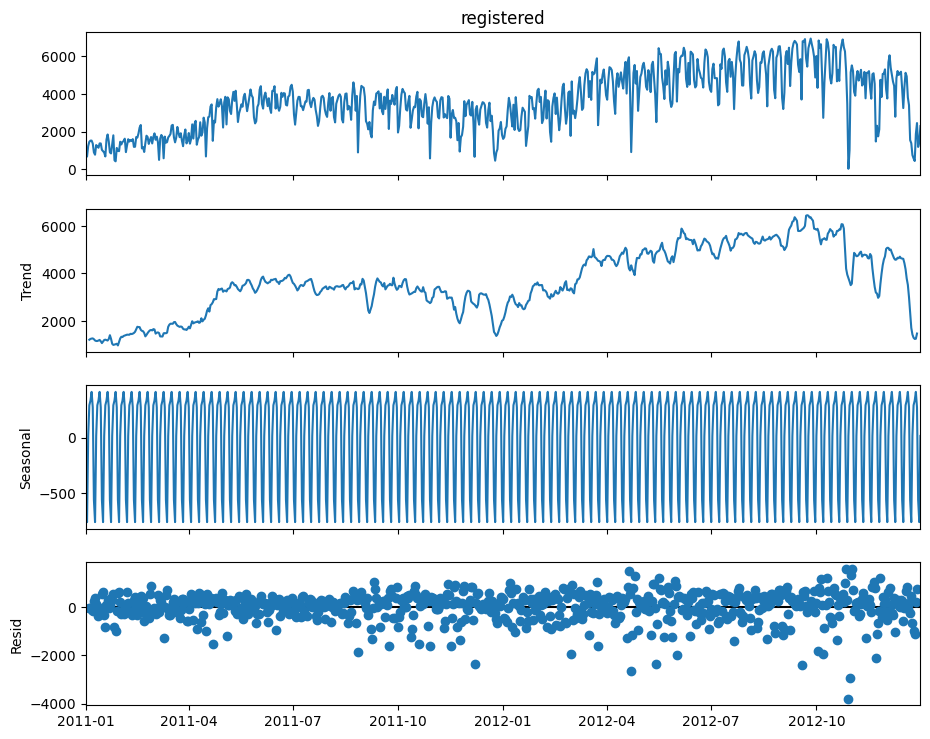

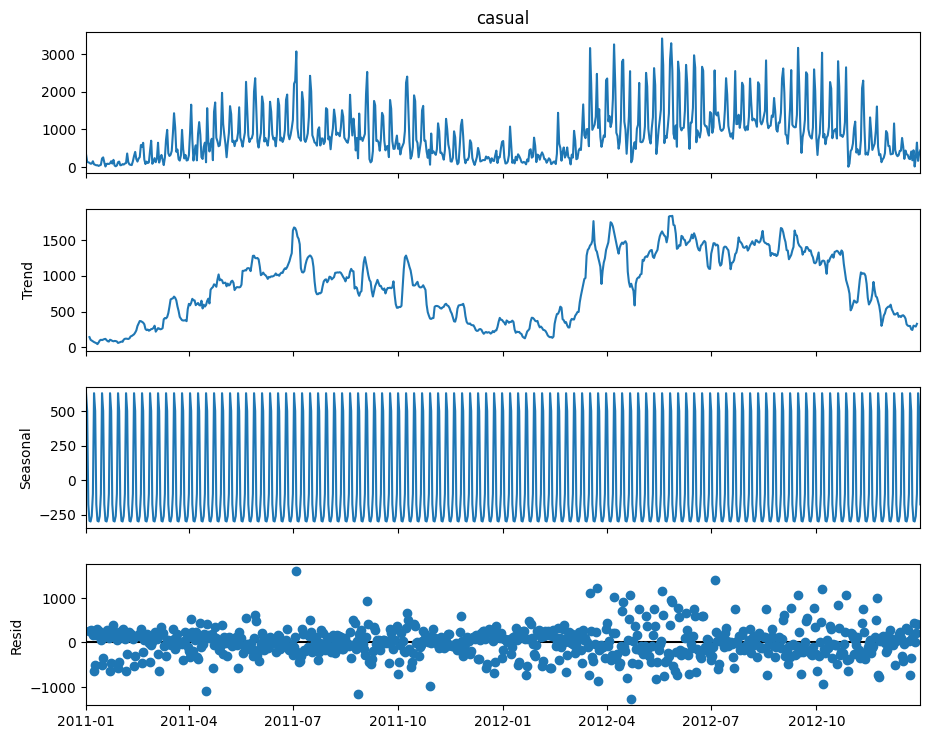

In [49]:
registered_plot = registered_decomposition.plot()
registered_plot.set_size_inches(10, 8)
casual_plot = casual_decomposition.plot()
casual_plot.set_size_inches(10, 8)

Testing for stationary 

<Figure size 640x480 with 0 Axes>

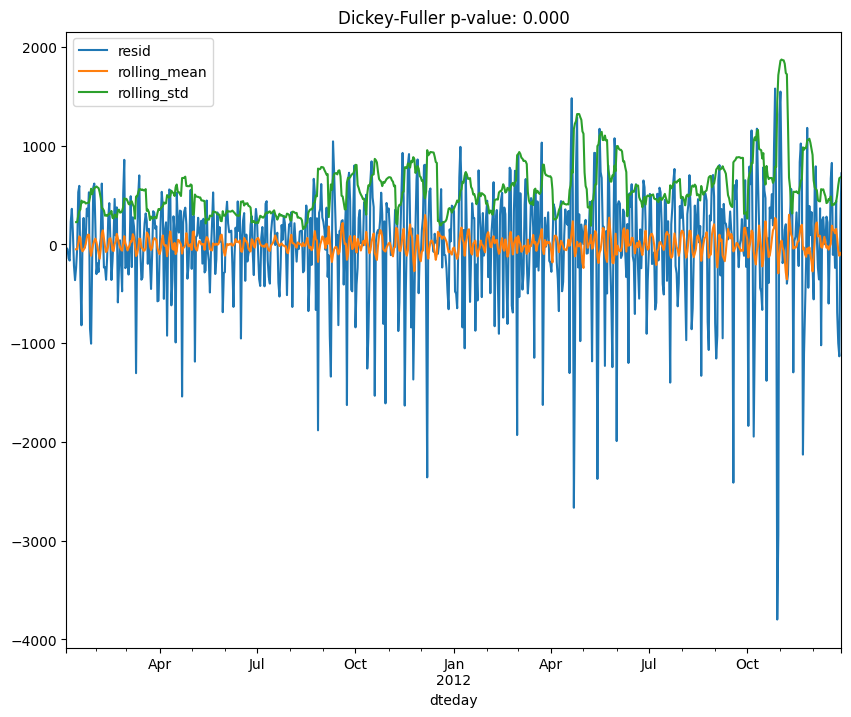

<Figure size 640x480 with 0 Axes>

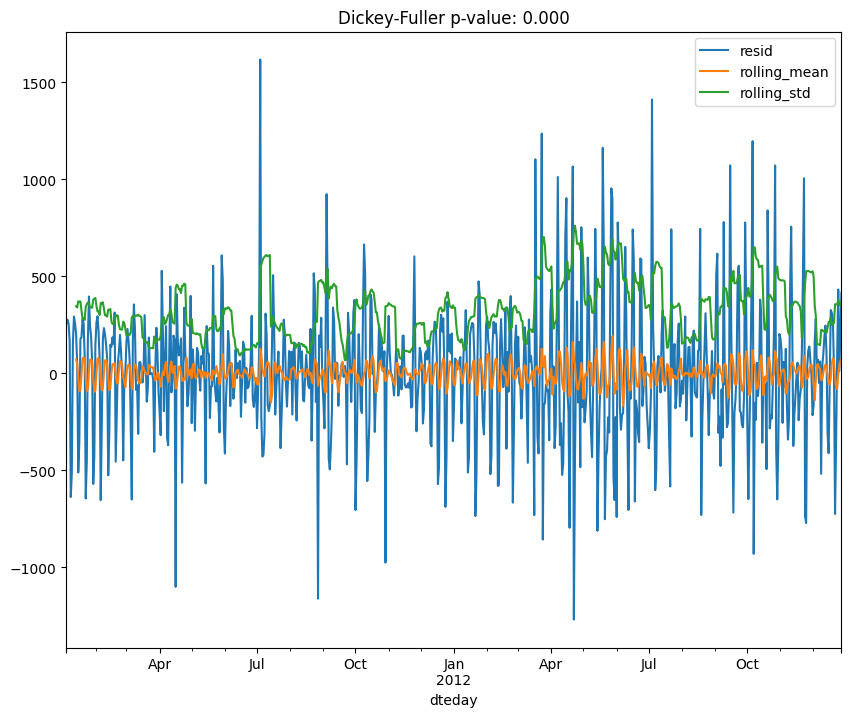

In [50]:
plt.figure()
test_stationarity(registered_decomposition.resid.dropna(), \
                  figsize=(10, 8))
plt.figure()
test_stationarity(casual_decomposition.resid.dropna(), \
                  figsize=(10, 8))

 ACF and PACF Plots for Registered Rides

In [51]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf


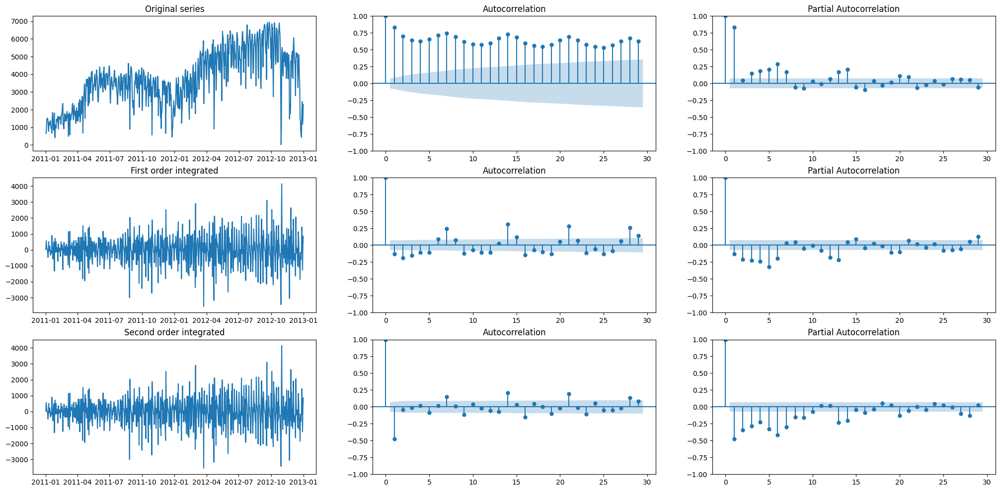

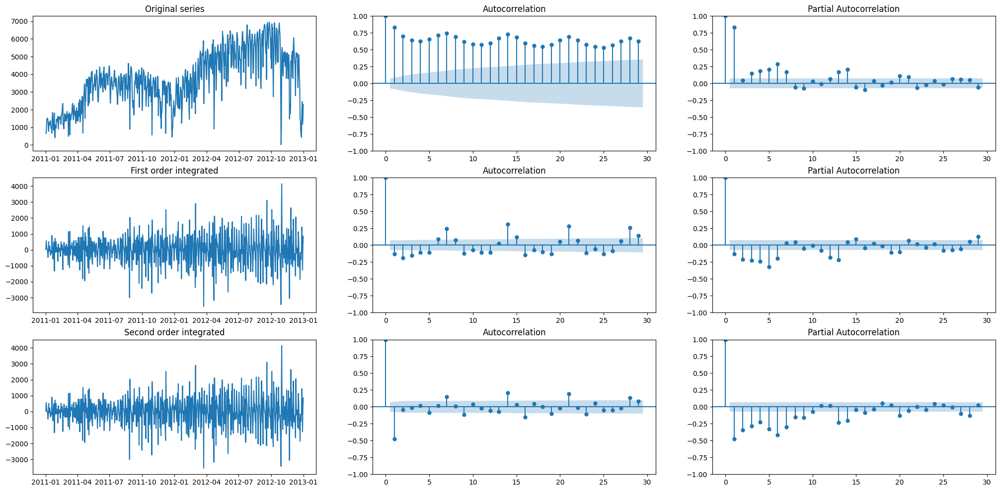

In [52]:
fig, axes = plt.subplots(3, 3, figsize=(25, 12))
original = daily_rides["registered"]
axes[0,0].plot(original)
axes[0,0].set_title("Original series")
plot_acf(original, ax=axes[0,1])
plot_pacf(original, ax=axes[0,2])
first_order_int = original.diff().dropna()
axes[1,0].plot(first_order_int)
axes[1,0].set_title("First order integrated")
plot_acf(first_order_int, ax=axes[1,1])
plot_pacf(first_order_int, ax=axes[1,2])
second_order_int = first_order_int.diff().dropna()
axes[2,0].plot(first_order_int)
axes[2,0].set_title("Second order integrated")
plot_acf(second_order_int, ax=axes[2,1])
plot_pacf(second_order_int, ax=axes[2,2])


In [53]:
from pmdarima import auto_arima


In [54]:
model = auto_arima(registered, start_p=1, start_q=1, \
                   max_p=3, max_q=3, information_criterion="aic")
print(model.summary())

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  731
Model:               SARIMAX(3, 1, 3)   Log Likelihood               -5854.543
Date:                Sun, 14 Apr 2024   AIC                          11723.086
Time:                        08:56:24   BIC                          11755.238
Sample:                    01-01-2011   HQIC                         11735.491
                         - 12-31-2012                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.6084      0.050     32.243      0.000       1.511       1.706
ar.L2         -1.4486      0.062    -23.248      0.000      -1.571      -1.326
ar.L3          0.3617      0.049      7.371      0.0

In [55]:
model = auto_arima(registered, start_p=1, start_q=1, \
                   max_p=3, max_q=3, information_criterion="bic")
print(model.summary())

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  731
Model:               SARIMAX(3, 1, 1)   Log Likelihood               -5901.924
Date:                Sun, 14 Apr 2024   AIC                          11813.848
Time:                        08:56:30   BIC                          11836.813
Sample:                    01-01-2011   HQIC                         11822.708
                         - 12-31-2012                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4775      0.037     13.059      0.000       0.406       0.549
ar.L2         -0.1428      0.038     -3.740      0.000      -0.218      -0.068
ar.L3         -0.1345      0.044     -3.070      0.0

Text(0.5, 1.0, 'Predicted vs actual number of rides')

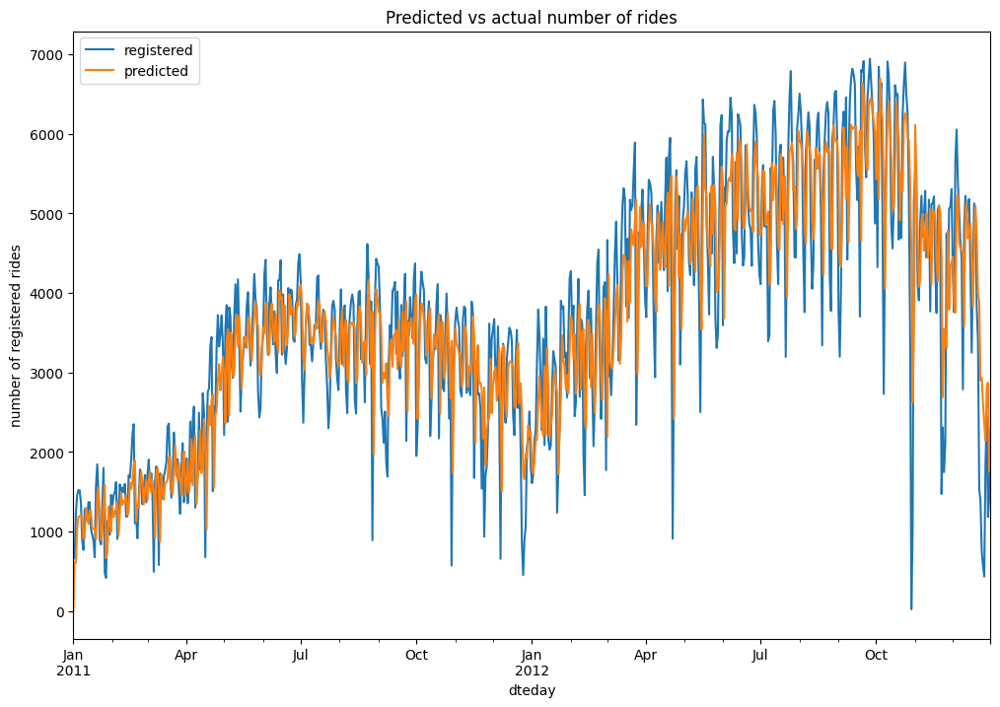

In [56]:
# plot original and predicted values
plot_data = pd.DataFrame(registered)
plot_data['predicted'] = model.predict_in_sample()
plot_data.plot(figsize=(12, 8))
plt.ylabel("number of registered rides")
plt.title("Predicted vs actual number of rides")

In [57]:
def plot_regression_all_conditions(data, column_name):
    conditions = ['clear', 'cloudy', 'light_rain_snow', 'heavy_rain_snow']
    
    plt.figure(figsize=(18, 10))
    for i, condition in enumerate(conditions):
        filtered_data = data[data['weathersit'] == condition]
        
        plt.subplot(2, 2, i+1)
        sns.regplot(x=column_name, y='registered', data=filtered_data, label='Registered', color='blue')
        sns.regplot(x=column_name, y='casual', data=filtered_data, label='Casual', color='red')
        plt.title(f'{column_name.capitalize()} vs Rides - {condition}')
        plt.legend()
    
    plt.tight_layout()
    plt.show()

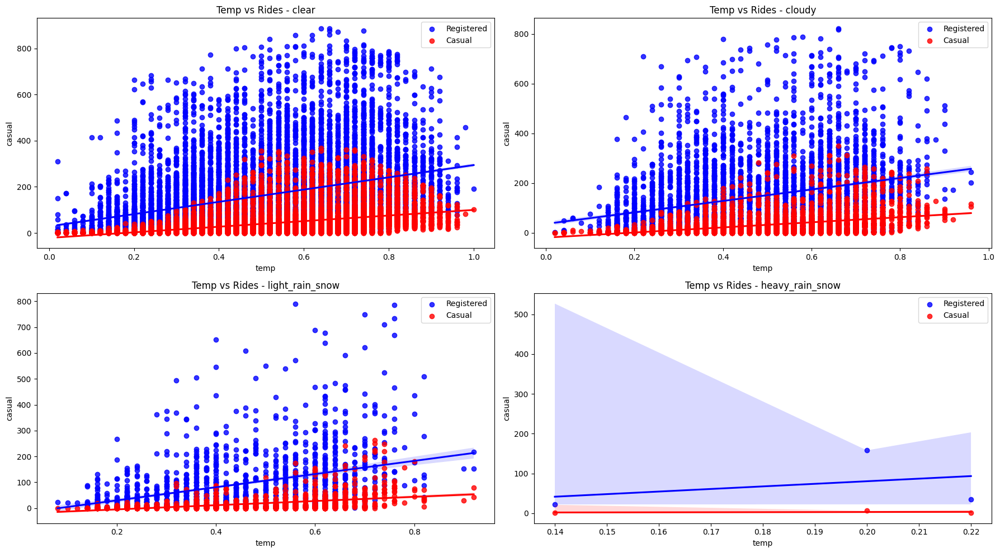

In [58]:
plot_regression_all_conditions(preprocessed_data,'temp')

In [59]:
preprocessed_data.weathersit.value_counts()

weathersit
clear              11413
cloudy              4544
light_rain_snow     1419
heavy_rain_snow        3
Name: count, dtype: int64

<Figure size 2000x3000 with 0 Axes>

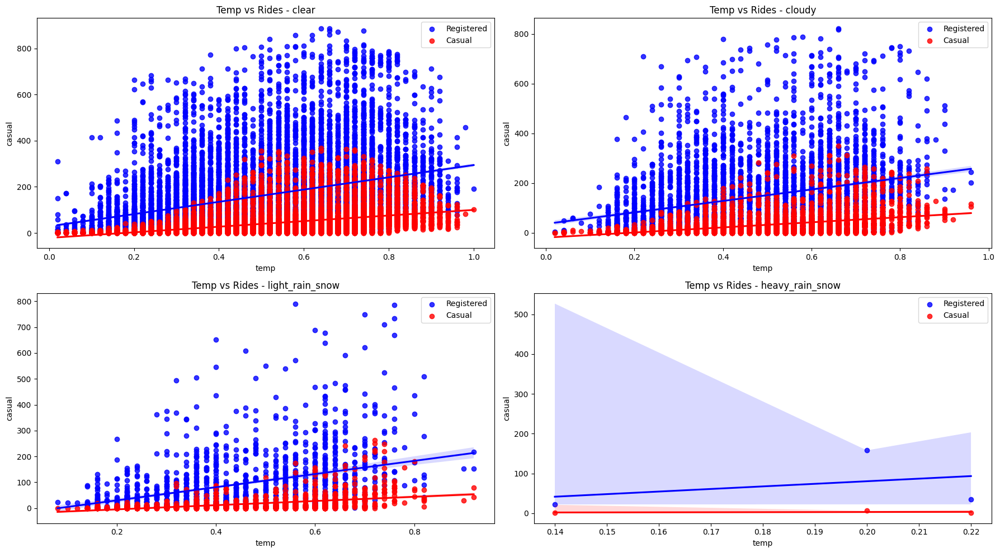

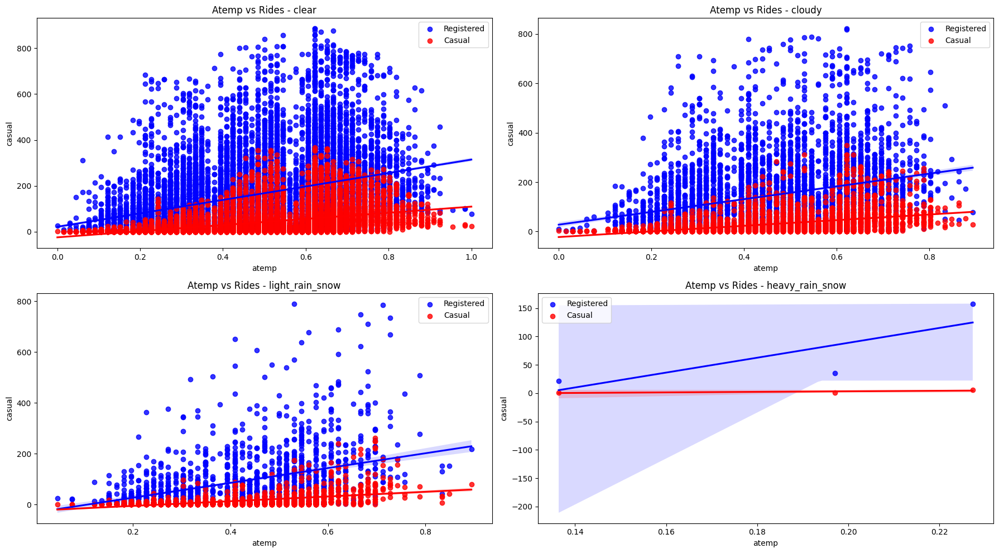

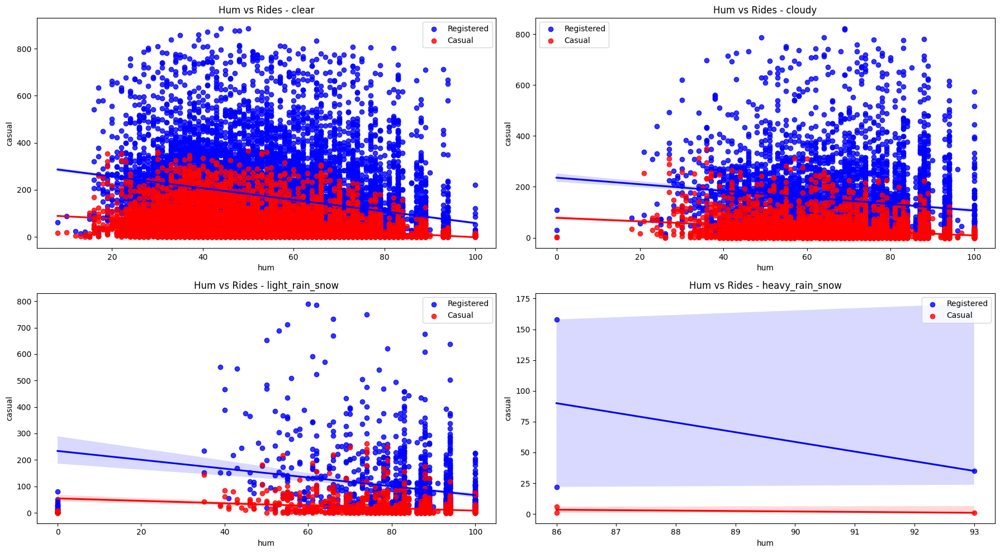

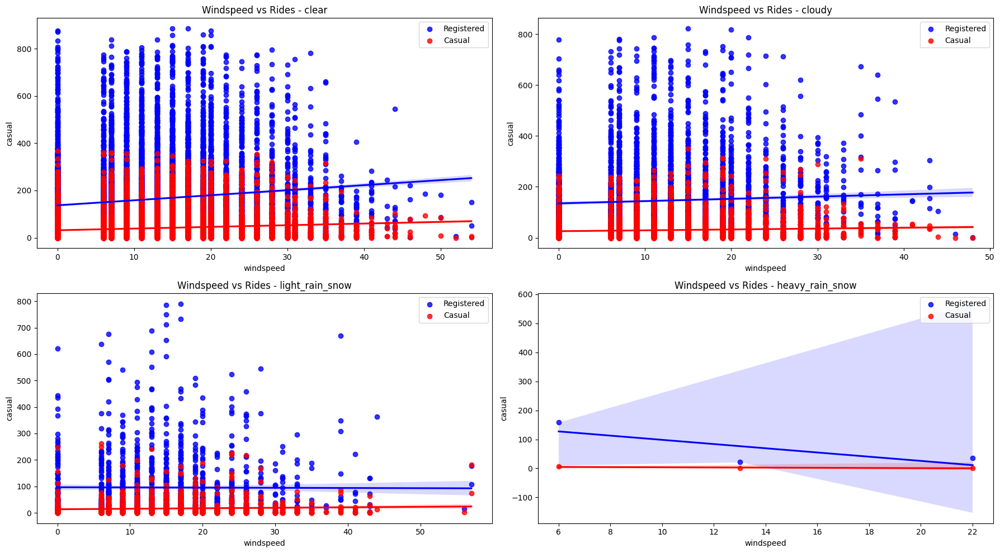

In [60]:
weather_conditions = preprocessed_data.weathersit.unique()
columns = ["temp", "atemp", "hum", "windspeed"]
plt.figure(figsize=(20,30))
for col_index, col in enumerate(columns):
    plot_regression_all_conditions(preprocessed_data,col)


In [61]:
preprocessed_data

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,winter,2011,1,0,0,Saturday,0,clear,0.24,0.2879,81.0,0.0000,3,13,16
1,2,2011-01-01,winter,2011,1,1,0,Saturday,0,clear,0.22,0.2727,80.0,0.0000,8,32,40
2,3,2011-01-01,winter,2011,1,2,0,Saturday,0,clear,0.22,0.2727,80.0,0.0000,5,27,32
3,4,2011-01-01,winter,2011,1,3,0,Saturday,0,clear,0.24,0.2879,75.0,0.0000,3,10,13
4,5,2011-01-01,winter,2011,1,4,0,Saturday,0,clear,0.24,0.2879,75.0,0.0000,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,17375,2012-12-31,winter,2012,12,19,0,Monday,1,cloudy,0.26,0.2576,60.0,11.0014,11,108,119
17375,17376,2012-12-31,winter,2012,12,20,0,Monday,1,cloudy,0.26,0.2576,60.0,11.0014,8,81,89
17376,17377,2012-12-31,winter,2012,12,21,0,Monday,1,clear,0.26,0.2576,60.0,11.0014,7,83,90
17377,17378,2012-12-31,winter,2012,12,22,0,Monday,1,clear,0.26,0.2727,56.0,8.9981,13,48,61


In [62]:
def print_correlations(data, col, weather_cond):
    corr_data = data[data['weathersit'] == weather_cond]
    pearson_corr_r = pearsonr(corr_data[col], \
                              corr_data["registered"])
    pearson_corr_c = pearsonr(corr_data[col], corr_data["casual"])
    print(f"Pearson correlation (registered, {col}): \
corr={pearson_corr_r[0]:.03f}, pval={pearson_corr_r[1]:.03f}")
    print(f"Pearson correlation (casual, {col}): \
corr={pearson_corr_c[0]:.03f}, pval={pearson_corr_c[1]:.03f}")

In [63]:
print_correlations(preprocessed_data,'temp','clear')

Pearson correlation (registered, temp): corr=0.340, pval=0.000
Pearson correlation (casual, temp): corr=0.459, pval=0.000


In [64]:
weather_conditions = preprocessed_data.weathersit.unique()
columns = ["temp", "atemp", "hum", "windspeed"]
for col in columns:
    for weather_cond in weather_conditions:
        print_correlations(preprocessed_data, col, weather_cond)


Pearson correlation (registered, temp): corr=0.340, pval=0.000
Pearson correlation (casual, temp): corr=0.459, pval=0.000
Pearson correlation (registered, temp): corr=0.285, pval=0.000
Pearson correlation (casual, temp): corr=0.437, pval=0.000
Pearson correlation (registered, temp): corr=0.356, pval=0.000
Pearson correlation (casual, temp): corr=0.433, pval=0.000
Pearson correlation (registered, temp): corr=0.360, pval=0.766
Pearson correlation (casual, temp): corr=0.277, pval=0.821
Pearson correlation (registered, atemp): corr=0.334, pval=0.000
Pearson correlation (casual, atemp): corr=0.451, pval=0.000
Pearson correlation (registered, atemp): corr=0.285, pval=0.000
Pearson correlation (casual, atemp): corr=0.434, pval=0.000
Pearson correlation (registered, atemp): corr=0.366, pval=0.000
Pearson correlation (casual, atemp): corr=0.445, pval=0.000
Pearson correlation (registered, atemp): corr=0.810, pval=0.399
Pearson correlation (casual, atemp): corr=0.756, pval=0.454
Pearson correlat

In [93]:
import pmdarima as pm

SARIMAmodel = pm.auto_arima(registered,  # your time series data
                      seasonal=True,  # whether to consider seasonal differencing
                      m=12,           # the seasonal period, e.g., 12 for monthly data
                      d=1,            # non-seasonal differencing
                      D=1,            # seasonal differencing
                      max_p=3, max_q=3,  # maximum p and q
                      max_P=3, max_Q=3,  # maximum P and Q
                      trace=True,        # print status on the fits
                      error_action='ignore',  # don't want to know if an order does not work
                      suppress_warnings=True,  # don't want convergence warnings
                      stepwise=True)  # stepwise algorithm iterates over model parameters

# Summary of the SARIMAmodel
print(model.summary())

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=4.86 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=12391.004, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=12167.825, Time=0.95 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.04 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=12388.311, Time=0.08 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=12015.849, Time=3.22 sec
 ARIMA(1,1,0)(3,1,0)[12]             : AIC=11922.783, Time=5.40 sec
 ARIMA(1,1,0)(3,1,1)[12]             : AIC=inf, Time=10.57 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=4.38 sec
 ARIMA(0,1,0)(3,1,0)[12]             : AIC=11960.602, Time=1.12 sec
 ARIMA(2,1,0)(3,1,0)[12]             : AIC=11892.048, Time=8.06 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=11984.881, Time=3.95 sec
 ARIMA(2,1,0)(3,1,1)[12]             : AIC=inf, Time=15.26 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=inf, Time=6.38 sec
 ARIMA(3,1,0)(3,1,0)[12]             : 

Text(0.5, 1.0, 'Predicted vs actual number of rides')

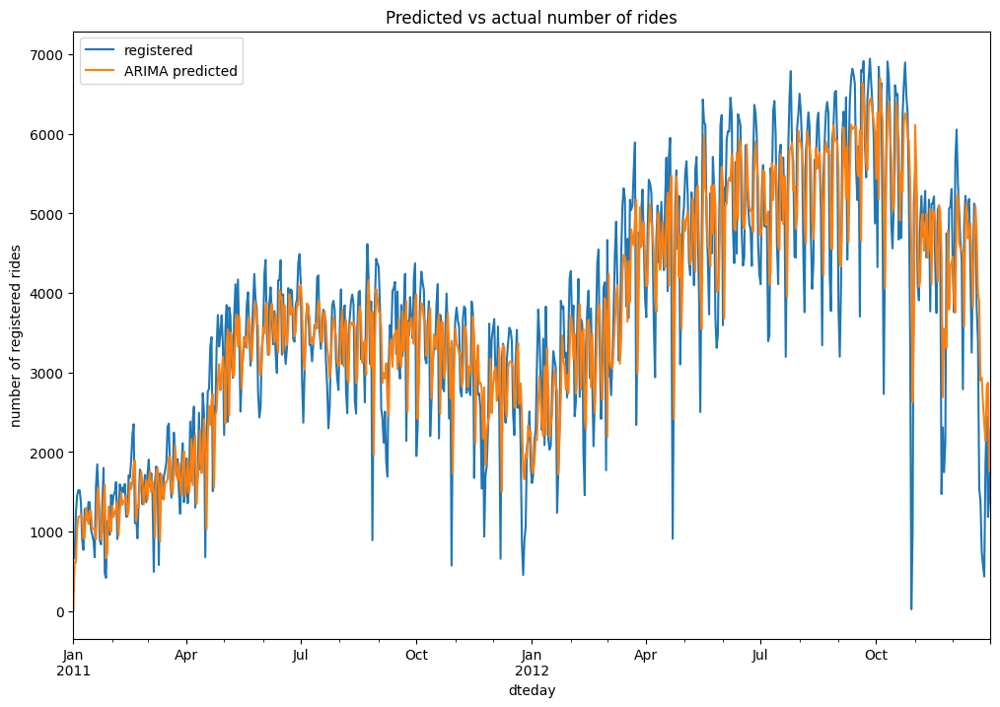

In [96]:
# plot original and predicted values
plot_data = pd.DataFrame(registered)
plot_data['ARIMA predicted'] = model.predict_in_sample()
#plot_data['SARIM predicted'] = SARIMAmodel.predict_in_sample()
plot_data.plot(figsize=(12, 8))
plt.ylabel("number of registered rides")
plt.title("Predicted vs actual number of rides")

In [ ]:

n_periods = 24  # for example, forecasting the next 24 time periods
future_forecast = model.predict(n_periods=n_periods)

# Turn the forecast into a series with a proper datetime index
forecast_index = pd.date_range(start=data.index[-1], periods=n_periods + 1, closed='right', freq='M')
forecast_series = pd.Series(future_forecast, index=forecast_index)


In [99]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# Example data

# Evaluate predictions
arima_mae = mean_absolute_error(registered, model.predict_in_sample())
sarima_mae = mean_absolute_error(registered, SARIMAmodel.predict_in_sample())

arima_rmse = np.sqrt(registered, model.predict_in_sample())
sarima_rmse = np.sqrt(registered, SARIMAmodel.predict_in_sample())

print(f'ARIMA MAE: {arima_mae}, RMSE: {arima_rmse}')
print(f'SARIMA MAE: {sarima_mae}, RMSE: {sarima_rmse}')


ARIMA MAE: 589.1730217272371, RMSE: dteday
2011-01-01    25.573424
2011-01-02    25.884358
2011-01-03    35.057096
2011-01-04    38.131352
2011-01-05    38.961519
                ...    
2012-12-27    43.208795
2012-12-28    49.507575
2012-12-29    34.380227
2012-12-30    37.841776
2012-12-31    47.853944
Name: registered, Length: 731, dtype: float64
SARIMA MAE: 641.6026695924082, RMSE: dteday
2011-01-01    25.573424
2011-01-02    25.884358
2011-01-03    35.057096
2011-01-04    38.131352
2011-01-05    38.961519
                ...    
2012-12-27    43.208795
2012-12-28    49.507575
2012-12-29    34.380227
2012-12-30    37.841776
2012-12-31    47.853944
Name: registered, Length: 731, dtype: float64


In [101]:
arima_errors = np.abs(model.predict_in_sample() - registered)
sarima_errors = np.abs(SARIMAmodel.predict_in_sample()- registered)

# Or calculate squared errors
arima_sq_errors = (model.predict_in_sample() - registered) ** 2
sarima_sq_errors = (SARIMAmodel.predict_in_sample() - registered) ** 2

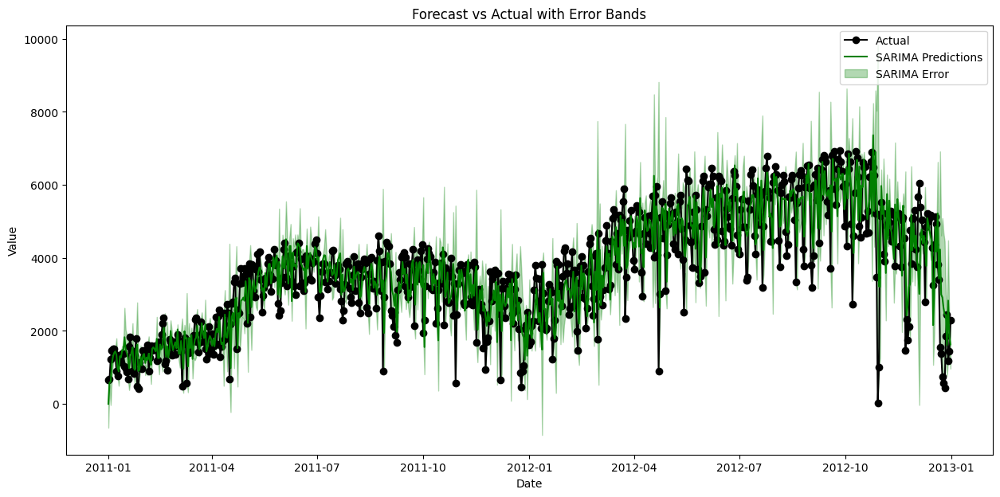

In [104]:
plt.figure(figsize=(15, 7))
plt.plot(registered.index, registered, label='Actual', color='black', marker='o')
#plt.plot(registered.index, model.predict_in_sample(), label='ARIMA Predictions', color='blue')
plt.plot(registered.index, SARIMAmodel.predict_in_sample(), label='SARIMA Predictions', color='green')

# Add error bars or bands
#plt.fill_between(registered.index, model.predict_in_sample() - arima_errors,  model.predict_in_sample() + arima_errors, color='blue', alpha=0.3, label='ARIMA Error')
plt.fill_between(registered.index, SARIMAmodel.predict_in_sample() - sarima_errors, SARIMAmodel.predict_in_sample() + sarima_errors, color='green', alpha=0.3, label='SARIMA Error')

# Labels, title, and legend
plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Forecast vs Actual with Error Bands')
plt.legend()
plt.show()

In [114]:
arima_pred=model.predict_in_sample()
sarima_pred=SARIMAmodel.predict_in_sample()

NameError: name 'test' is not defined

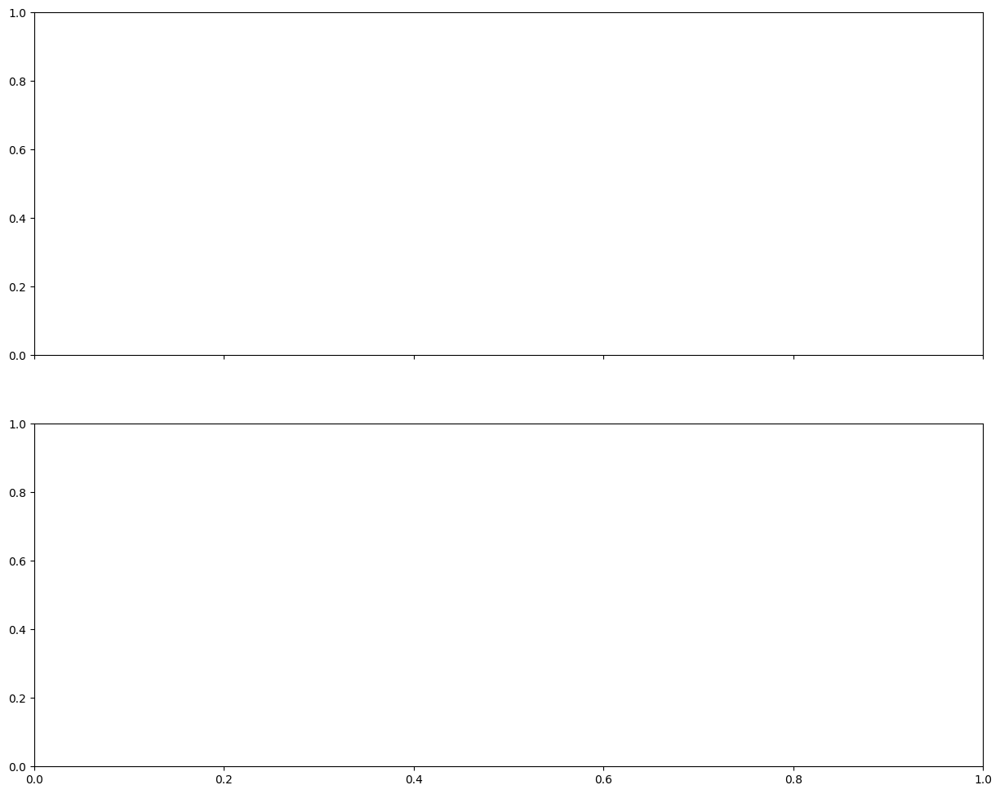

In [116]:
# ARIMA Plot
fig, axs = plt.subplots(2, 1, figsize=(15, 12), sharex=True)

axs[0].plot(registered.index, test, label='Actual', color='black', marker='o')
axs[0].plot(registered.index, arima_pred, label='ARIMA Predictions', color='blue')
axs[0].fill_between(registered.index, arima_pred - arima_errors, arima_pred + arima_errors, color='blue', alpha=0.3, label='ARIMA Error')
axs[0].set_title('ARIMA Forecast vs Actual with Error Bands')
axs[0].set_ylabel('Value')
axs[0].legend()

# SARIMA Plot
axs[1].plot(registered.index, test, label='Actual', color='black', marker='o')
axs[1].plot(registered.index, sarima_pred, label='SARIMA Predictions', color='green')
axs[1].fill_between(registered.index, sarima_pred - sarima_errors, sarima_pred + sarima_errors, color='green', alpha=0.3, label='SARIMA Error')
axs[1].set_title('SARIMA Forecast vs Actual with Error Bands')
axs[1].set_xlabel('Date')
axs[1].set_ylabel('Value')
axs[1].legend()

plt.show()